# Pure macro FX strategies: the benefits of double diversification

This notebook serves as an illustration of the points discussed in the post "Pure macro FX strategies: the benefits of double diversification" available on the Macrosynergy website. This post investigates a pure macro strategy for FX forward trading across developed and emerging countries based on an "external strength score" considering economic growth, external balances, and terms-of-trade.

This notebook provides the essential code required to replicate the analysis discussed in the post. 

## Get packages and JPMaQS data

This notebook primarily relies on the standard packages available in the Python data science stack. However, there is an additional package `macrosynergy` that is required for two purposes:

- Downloading JPMaQS data: The `macrosynergy` package facilitates the retrieval of JPMaQS data, which is used in the notebook.

- For the analysis of quantamental data and value propositions: The `macrosynergy` package provides functionality for performing quick analyses of quantamental data and exploring value propositions.

For detailed information and a comprehensive understanding of the `macrosynergy` package and its functionalities, please refer to the [“Introduction to Macrosynergy package”](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php) notebook on the Macrosynergy Quantamental Academy or visit the following link on [Kaggle](https://www.kaggle.com/code/macrosynergy/introduction-to-macrosynergy-package).

In [1]:
# Run only if needed!
"""!pip install macrosynergy --upgrade"""

'!pip install macrosynergy --upgrade'

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.signal as mss
import macrosynergy.pnl as msn

from macrosynergy.download import JPMaQSDownload

import warnings

warnings.simplefilter("ignore")

The JPMaQS indicators we consider are downloaded using the J.P. Morgan Dataquery API interface within the `macrosynergy` package. This is done by specifying ticker strings, formed by appending an indicator category code <category> to a currency area code <cross_section>. These constitute the main part of a full quantamental indicator ticker, taking the form `DB(JPMAQS,<cross_section>_<category>,<info>)`, where <info> denotes the time series of information for the given cross-section and category. The following types of information are available:

`value` giving the latest available values for the indicator
`eop_lag` referring to days elapsed since the end of the observation period
`mop_lag` referring to the number of days elapsed since the mean observation period
`grade` denoting a grade of the observation, giving a metric of real-time information quality.

After instantiating the `JPMaQSDownload` class within the `macrosynergy.download` module, one can use the `download(tickers,start_date,metrics)` method to easily download the necessary data, where `tickers` is an array of ticker strings, `start_date` is the first collection date to be considered and `metrics` is an array comprising the times series information to be downloaded. For more information see [here](https://github.com/macrosynergy/macrosynergy/blob/develop/README.md).

In [3]:
# General cross-sections lists

cids_g3 = ["EUR", "JPY", "USD"]  # DM large curency areas
cids_dmsc = ["AUD", "CAD", "CHF", "GBP", "NOK", "NZD", "SEK"]  # DM small currency areas
cids_latm = ["BRL", "COP", "CLP", "MXN", "PEN"]  # Latam
cids_emea = ["CZK", "HUF", "ILS", "PLN", "RON", "RUB", "TRY", "ZAR"]  # EMEA
cids_emas = ["IDR", "INR", "KRW", "MYR", "PHP", "SGD", "THB", "TWD"]  # EM Asia ex China

cids_dm = cids_g3 + cids_dmsc
cids_em = cids_latm + cids_emea + cids_emas
cids = cids_dm + cids_em

# FX cross-sections lists

cids_nofx = [
    "EUR",
    "USD",
    "JPY",
    "SGD",
    "RUB",
]  # not small or suitable for this analysis
cids_fx = list(set(cids) - set(cids_nofx))

cids_dmfx = list(set(cids_dm).intersection(cids_fx))
cids_emfx = list(set(cids_em).intersection(cids_fx))

cids_eur = ["CHF", "CZK", "HUF", "NOK", "PLN", "RON", "SEK"]  # trading against EUR
cids_eud = ["GBP", "TRY"]  # trading against EUR and USD
cids_usd = list(set(cids_fx) - set(cids_eur + cids_eud))  # trading against USD

In [4]:
# Category tickers

# External balances changes
xbds = [
    # Very short-term changes
    "MTBGDPRATIO_SA_3MMA_D1M1ML3",
    "CABGDPRATIO_SA_3MMA_D1M1ML3",
    "CABGDPRATIO_SA_1QMA_D1Q1QL1",
    # Short-term changes
    "MTBGDPRATIO_SA_6MMA_D1M1ML6",
    "CABGDPRATIO_SA_6MMA_D1M1ML6",
    "CABGDPRATIO_SA_2QMA_D1Q1QL2",
    # Medium-term changes
    "MTBGDPRATIO_SA_3MMAv60MMA",
    "CABGDPRATIO_SA_3MMAv60MMA",
    "CABGDPRATIO_SA_1QMAv20QMA",
]

# Economic growth trends and changes

gtds = [
    # Intutive growth estimates
    "INTRGDP_NSA_P1M1ML12_3MMA",
    "INTRGDPv5Y_NSA_P1M1ML12_3MMA",
    "INTRGDP_NSA_P1M1ML12_D3M3ML3",
    # Technical growth estimates
    "RGDPTECH_SA_P1M1ML12_3MMA",
    "RGDPTECHv5Y_SA_P1M1ML12_3MMA",
    "RGDPTECH_SA_P1M1ML12_D3M3ML3",
]

# Terms-of-trade changes
ttds = [
    # commodity-based changes
    "CTOT_NSA_P1M12ML1",
    "CTOT_NSA_P1M1ML12",
    "CTOT_NSA_P1M60ML1",
    # mixed dynamics
    "MTOT_NSA_P1M12ML1",
    "MTOT_NSA_P1M1ML12",
    "MTOT_NSA_P1M60ML1",
]

# Manufacturing confidence scores and changes
msds = [
    # Manufacturing confidence scores
    "MBCSCORE_SA",
    "MBCSCORE_SA_3MMA",
    # Short-term changes
    "MBCSCORE_SA_D3M3ML3",
    "MBCSCORE_SA_D1Q1QL1",
    # Medium-term changes
    "MBCSCORE_SA_D6M6ML6",
    "MBCSCORE_SA_D2Q2QL2",
]


main = xbds + gtds + ttds + msds


rets = [
    "FXXR_NSA",
    "FXXR_VT10",
    "FXTARGETED_NSA",
    "FXUNTRADABLE_NSA",
]

xcats = main + rets

# Extra tickers

xtix = ["USD_EQXR_NSA", "USD_GB10YXR_NSA"]

# Resultant tickers

tickers = [cid + "_" + xcat for cid in cids for xcat in xcats] + xtix
print(f"Maximum number of tickers is {len(tickers)}")

Maximum number of tickers is 963


JPMaQS indicators are conveniently grouped into 6 main categories: Economic Trends, Macroeconomic balance sheets, Financial conditions, Shocks and risk measures, Stylized trading factors, and Generic returns. Each indicator has a separate page with notes, description, availability, statistical measures, and timelines for main currencies. The description of each JPMaQS category is available under [Macro quantamental academy](https://academy.macrosynergy.com/quantamental-indicators/). For tickers used in this notebook see [External ratios trends](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/External%20ratios%20trends.php), [Terms-of-trade](https://academy.macrosynergy.com/academy/Themes/Financial%20conditions/_build/html/notebooks/Terms-of-trade.php), [Intuitive growth estimates](https://macrosynergy.com/academy/notebooks/intuitive-gdp-growth-estimates/), [Technical real GDP trends](https://macrosynergy.com/academy/notebooks/technical-gdp-growth-estimates/), [Manufacturing confidence scores](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Manufacturing%20confidence%20scores.php),  [FX forward returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/FX%20forward%20returns.php), and [FX tradeability and flexibility](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/FX%20tradeability%20and%20flexibility.php).

In [5]:
start_date = "2000-01-01"
end_date = "2023-05-01"

# Retrieve credentials

client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

with JPMaQSDownload(client_id=client_id, client_secret=client_secret) as dq:
    df = dq.download(
        tickers=tickers,
        start_date=start_date,
        end_date=end_date,
        suppress_warning=True,
        metrics=["all"],
        report_time_taken=True,
        show_progress=True,
    )

Timestamp UTC:  2024-05-03 09:56:14
Connection successful!


Requesting data: 100%|██████████| 193/193 [00:44<00:00,  4.33it/s]


Time taken to download data: 	70.03 seconds.
Some expressions are missing from the downloaded data. Check logger output for complete list.
676 out of 3852 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.


In [6]:
dfx = df.copy().sort_values(["cid", "xcat", "real_date"])
dfx.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4607931 entries, 0 to 4607930
Data columns (total 7 columns):
 #   Column     Dtype         
---  ------     -----         
 0   real_date  datetime64[ns]
 1   cid        object        
 2   xcat       object        
 3   eop_lag    float64       
 4   grading    float64       
 5   mop_lag    float64       
 6   value      float64       
dtypes: datetime64[ns](1), float64(4), object(2)
memory usage: 281.2+ MB


## Blacklist dictionaries

Identifying and isolating periods of official exchange rate targets, illiquidity, or convertibility-related distortions in FX markets is the first step in creating an FX trading strategy. These periods can significantly impact the behavior and dynamics of currency markets, and failing to account for them can lead to inaccurate or misleading findings. A standard blacklist dictionary (`fxblack` in the cell below) can be passed to several `macrosynergy` package functions that exclude the blacklisted periods from related analyses. 

In [7]:
dfb = df[df["xcat"].isin(["FXTARGETED_NSA", "FXUNTRADABLE_NSA"])].loc[
    :, ["cid", "xcat", "real_date", "value"]
]
dfba = (
    dfb.groupby(["cid", "real_date"])
    .aggregate(value=pd.NamedAgg(column="value", aggfunc="max"))
    .reset_index()
)
dfba["xcat"] = "FXBLACK"
fxblack = msp.make_blacklist(dfba, "FXBLACK")
fxblack

{'BRL': (Timestamp('2012-12-03 00:00:00'), Timestamp('2013-09-30 00:00:00')),
 'CHF': (Timestamp('2011-10-03 00:00:00'), Timestamp('2015-01-30 00:00:00')),
 'CZK': (Timestamp('2014-01-01 00:00:00'), Timestamp('2017-07-31 00:00:00')),
 'ILS': (Timestamp('2000-01-03 00:00:00'), Timestamp('2005-12-30 00:00:00')),
 'INR': (Timestamp('2000-01-03 00:00:00'), Timestamp('2004-12-31 00:00:00')),
 'MYR_1': (Timestamp('2000-01-03 00:00:00'), Timestamp('2007-11-30 00:00:00')),
 'MYR_2': (Timestamp('2018-07-02 00:00:00'), Timestamp('2023-05-01 00:00:00')),
 'PEN': (Timestamp('2021-07-01 00:00:00'), Timestamp('2021-07-30 00:00:00')),
 'RON': (Timestamp('2000-01-03 00:00:00'), Timestamp('2005-11-30 00:00:00')),
 'RUB_1': (Timestamp('2000-01-03 00:00:00'), Timestamp('2005-11-30 00:00:00')),
 'RUB_2': (Timestamp('2022-02-01 00:00:00'), Timestamp('2023-05-01 00:00:00')),
 'SGD': (Timestamp('2000-01-03 00:00:00'), Timestamp('2023-05-01 00:00:00')),
 'THB': (Timestamp('2007-01-01 00:00:00'), Timestamp('20

# Availability and renaming

It is important to assess data availability before conducting any analysis. It allows to identification of any potential gaps or limitations in the dataset, which can impact the validity and reliability of analysis and ensure that a sufficient number of observations for each selected category and cross-section is available as well as determining the appropriate time periods for analysis. 

## External balances changes

In [8]:
msm.missing_in_df(df, xcats=xbds, cids=cids)

No missing XCATs across DataFrame.
Missing cids for CABGDPRATIO_SA_1QMA_D1Q1QL1:  ['BRL', 'CZK', 'EUR', 'GBP', 'JPY', 'KRW', 'PHP', 'PLN', 'RON', 'THB', 'TRY']
Missing cids for CABGDPRATIO_SA_1QMAv20QMA:    ['BRL', 'CZK', 'EUR', 'GBP', 'JPY', 'KRW', 'PHP', 'PLN', 'RON', 'THB', 'TRY']
Missing cids for CABGDPRATIO_SA_2QMA_D1Q1QL2:  ['BRL', 'CZK', 'EUR', 'GBP', 'JPY', 'KRW', 'PHP', 'PLN', 'RON', 'THB', 'TRY']
Missing cids for CABGDPRATIO_SA_3MMA_D1M1ML3:  ['AUD', 'CAD', 'CHF', 'CLP', 'COP', 'HUF', 'IDR', 'ILS', 'INR', 'MXN', 'MYR', 'NOK', 'NZD', 'PEN', 'RON', 'RUB', 'SEK', 'SGD', 'TWD', 'USD', 'ZAR']
Missing cids for CABGDPRATIO_SA_3MMAv60MMA:    ['AUD', 'CAD', 'CHF', 'CLP', 'COP', 'HUF', 'IDR', 'ILS', 'INR', 'MXN', 'MYR', 'NOK', 'NZD', 'PEN', 'RON', 'RUB', 'SEK', 'SGD', 'TWD', 'USD', 'ZAR']
Missing cids for CABGDPRATIO_SA_6MMA_D1M1ML6:  ['AUD', 'CAD', 'CHF', 'CLP', 'COP', 'HUF', 'IDR', 'ILS', 'INR', 'MXN', 'MYR', 'NOK', 'NZD', 'PEN', 'RON', 'RUB', 'SEK', 'SGD', 'TWD', 'USD', 'ZAR']
Missi

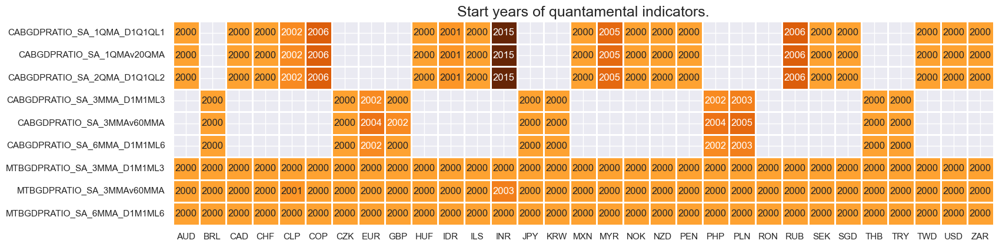

In [9]:
msm.check_availability(df, xcats=xbds, cids=cids, missing_recent=False)

We rename the indicators with `_...QMA` extension (indicating Quarters Moving Average) in the group [External ratios trends](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/External%20ratios%20trends.php) to `_...MMA` ( corresponding 3/6 months moving average) in order to align the naming conventions within the same group.

In [10]:
dict_repl = {
    "CABGDPRATIO_SA_1QMA_D1Q1QL1": "CABGDPRATIO_SA_3MMA_D1M1ML3",
    "CABGDPRATIO_SA_2QMA_D1Q1QL2": "CABGDPRATIO_SA_6MMA_D1M1ML6",
    "CABGDPRATIO_SA_1QMAv20QMA": "CABGDPRATIO_SA_3MMAv60MMA",
}

for key, value in dict_repl.items():
    dfx["xcat"] = dfx["xcat"].str.replace(key, value)

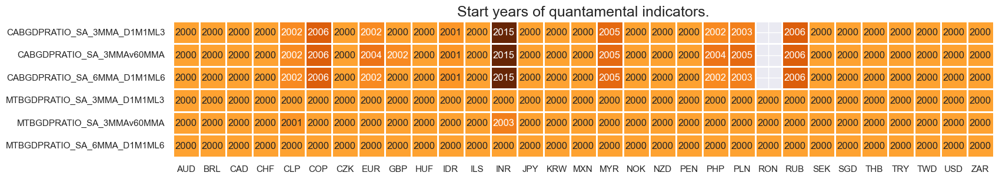

In [11]:
msm.check_availability(dfx, xcats=xbds, cids=cids, missing_recent=False)

## Economic growth trends and changes

In [12]:
msm.missing_in_df(df, xcats=gtds, cids=cids)

No missing XCATs across DataFrame.
Missing cids for INTRGDP_NSA_P1M1ML12_3MMA:     []
Missing cids for INTRGDP_NSA_P1M1ML12_D3M3ML3:  []
Missing cids for INTRGDPv5Y_NSA_P1M1ML12_3MMA:  []
Missing cids for RGDPTECH_SA_P1M1ML12_3MMA:     []
Missing cids for RGDPTECH_SA_P1M1ML12_D3M3ML3:  []
Missing cids for RGDPTECHv5Y_SA_P1M1ML12_3MMA:  []


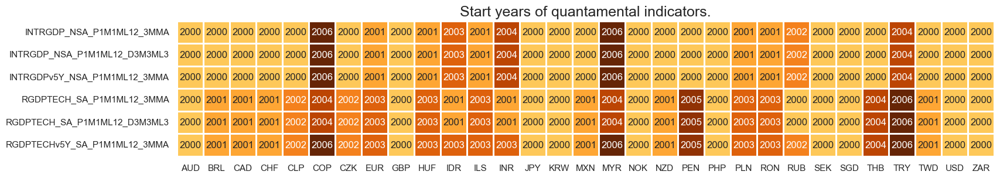

In [13]:
msm.check_availability(df, xcats=gtds, cids=cids, missing_recent=False)

## Terms-of-trade changes

In [14]:
msm.missing_in_df(df, xcats=ttds, cids=cids)

No missing XCATs across DataFrame.
Missing cids for CTOT_NSA_P1M12ML1:  []
Missing cids for CTOT_NSA_P1M1ML12:  []
Missing cids for CTOT_NSA_P1M60ML1:  []
Missing cids for MTOT_NSA_P1M12ML1:  []
Missing cids for MTOT_NSA_P1M1ML12:  []
Missing cids for MTOT_NSA_P1M60ML1:  []


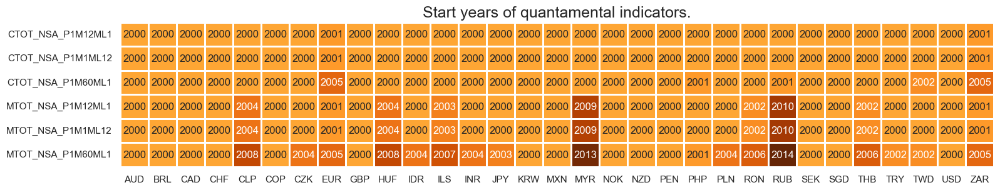

In [15]:
msm.check_availability(df, xcats=ttds, cids=cids, missing_recent=False)

## Confidence scores and changes

In [16]:
msm.missing_in_df(df, xcats=msds, cids=cids)

No missing XCATs across DataFrame.
Missing cids for MBCSCORE_SA:          ['THB']
Missing cids for MBCSCORE_SA_3MMA:     ['IDR', 'MYR', 'PHP', 'THB']
Missing cids for MBCSCORE_SA_D1Q1QL1:  ['AUD', 'BRL', 'CAD', 'CHF', 'CLP', 'COP', 'CZK', 'EUR', 'GBP', 'HUF', 'ILS', 'INR', 'JPY', 'KRW', 'MXN', 'NOK', 'NZD', 'PEN', 'PLN', 'RON', 'RUB', 'SEK', 'SGD', 'THB', 'TRY', 'TWD', 'USD', 'ZAR']
Missing cids for MBCSCORE_SA_D2Q2QL2:  ['AUD', 'BRL', 'CAD', 'CHF', 'CLP', 'COP', 'CZK', 'EUR', 'GBP', 'HUF', 'ILS', 'INR', 'JPY', 'KRW', 'MXN', 'NOK', 'NZD', 'PEN', 'PLN', 'RON', 'RUB', 'SEK', 'SGD', 'THB', 'TRY', 'TWD', 'USD', 'ZAR']
Missing cids for MBCSCORE_SA_D3M3ML3:  ['IDR', 'MYR', 'PHP', 'THB']
Missing cids for MBCSCORE_SA_D6M6ML6:  ['IDR', 'MYR', 'PHP', 'THB']


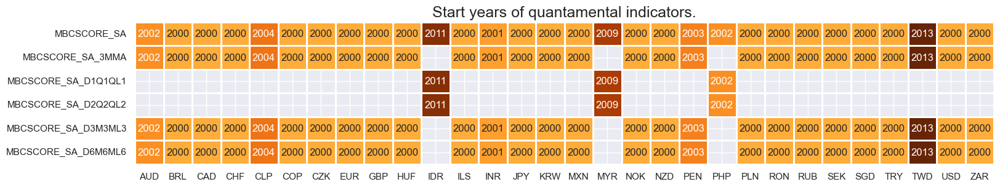

In [17]:
msm.check_availability(df, xcats=msds, cids=cids, missing_recent=False)

We rename the indicators with `_...D1Q1QL1` and `D2Q2QL2` extensions (indicating Quarterly data) in the group [Manufacturing confidence scores](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Manufacturing%20confidence%20scores.php) to `_...D3M3ML3` and `_...D6M6ML6` ( corresponding 3/6 months) in order to align the naming conventions within the same group.

In [18]:
dict_repl = {
    "MBCSCORE_SA_D1Q1QL1": "MBCSCORE_SA_D3M3ML3",
    "MBCSCORE_SA_D2Q2QL2": "MBCSCORE_SA_D6M6ML6",
}

for key, value in dict_repl.items():
    dfx["xcat"] = dfx["xcat"].str.replace(key, value)

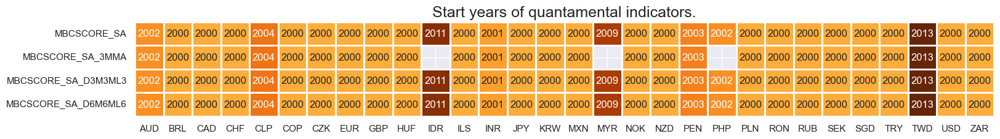

In [19]:
msm.check_availability(dfx, xcats=msds, cids=cids, missing_recent=False)

## Returns

In [20]:
oths = rets
msm.missing_in_df(df, xcats=oths, cids=cids)

No missing XCATs across DataFrame.
Missing cids for FXTARGETED_NSA:    ['USD']
Missing cids for FXUNTRADABLE_NSA:  ['USD']
Missing cids for FXXR_NSA:          ['USD']
Missing cids for FXXR_VT10:         ['USD']


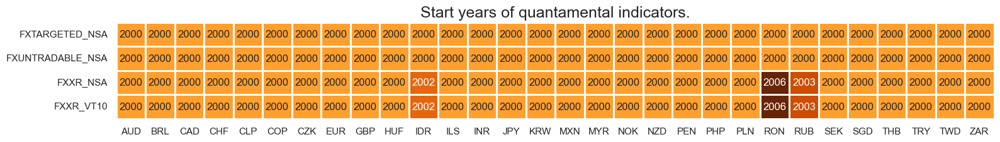

In [21]:
msm.check_availability(df, xcats=oths, cids=cids, missing_recent=False)

# Transformations and checks

## Features

### External ratio changes

The `macrosynergy` package provides two useful functions, `view_ranges()` and `view_timelines()`, which facilitate the convenient visualization of data for selected indicators and cross-sections. These functions assist in plotting means, standard deviations, and time series of the chosen indicators. We use `view_timelines()` extensively in this notebook. Please see the corresponding section in the notebook [Introduction to Macrosynergy package](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines)

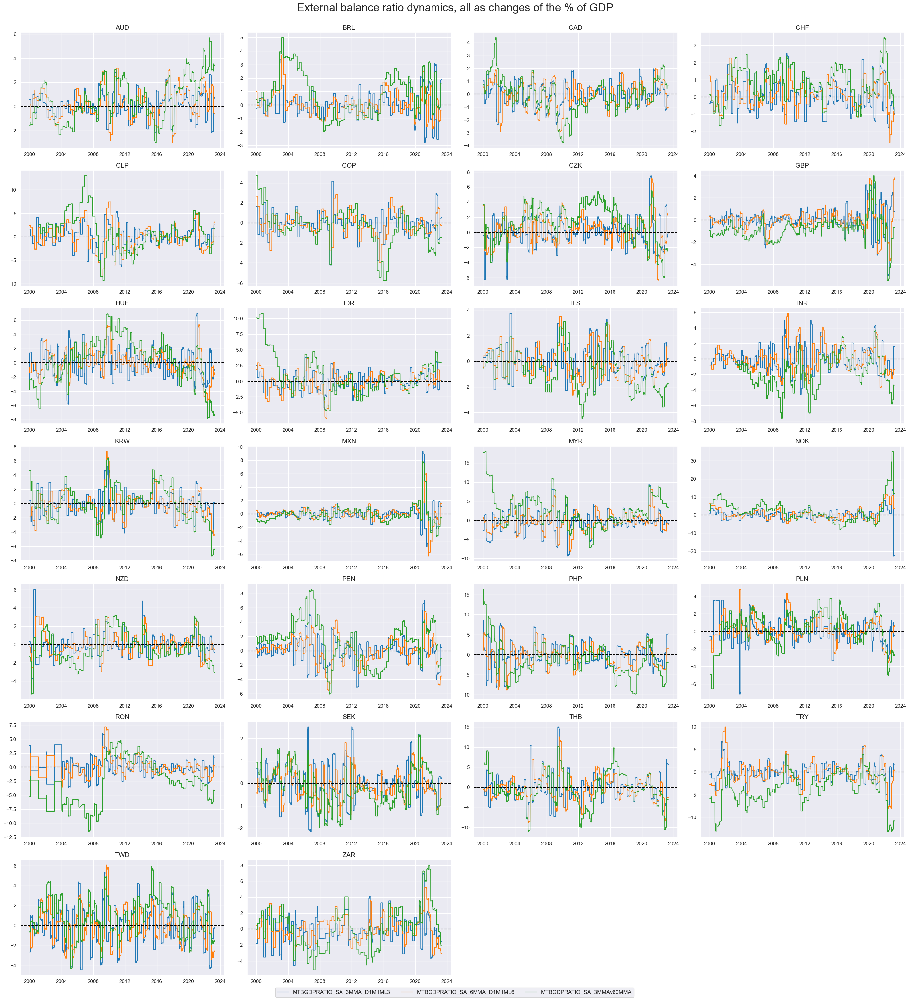

In [22]:
xcatx = [
    "MTBGDPRATIO_SA_3MMA_D1M1ML3",
    "MTBGDPRATIO_SA_6MMA_D1M1ML6",
    "MTBGDPRATIO_SA_3MMAv60MMA",
]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="External balance ratio dynamics, all as changes of the % of GDP",
    title_fontsize=24,
    )

#### Scoring

The `macrosynergy` function `make_zn_scores()` normalizes values across different categories. This is particularly important when summing or averaging categories with different units and time series properties. The function computes z-scores for a category panel around a specified neutral level that may be different from the mean. The term “zn-score” refers to the normalized distance from the neutral value (0 in the cell below).

The default mode of the function calculates scores based on sequential estimates of means and standard deviations, using only past information. This is controlled by the sequential=True argument, and the minimum number of observations required for meaningful estimates is set with the min_obs argument. By default, the function calculates zn-scores for the initial sample period defined by min_obs on an in-sample basis to avoid losing history (we chose 5 years below).

The means and standard deviations are re-estimated daily by default, but the frequency of re-estimation can be controlled with the est_freq argument (we choose monthly here). For more details and options please see [Academy notebooks](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#normalize-panels-with-make-zn-scores). 

In the cell below the External ratio trends are zn-scored around zero value, using zero as the neutral value, 3 as the cutoff value for winsorization in terms of standard deviations, 5 years of minimum number of observations, and monthly re-estimation frequency. Since the categories are homogeneous across countries, we use the whole panel as the basis for the parameters rather than individual cross-section. 

In [23]:
xbdx = [xc for xc in xbds if "Q" not in xc]

xcatx = xbdx
cidx = cids_fx

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

We display the newly created z-scores for Short-term trade and current account balance trends, 3M/3M (`MTBGDPRATIO_SA_3MMA_D1M1ML3`) and Longer-term trade and current account balance trends vs 5 year average(`MTBGDPRATIO_SA_3MMAv60MMA`). These z-scores get extension `_ZN` to distinguish them from the original indicators.

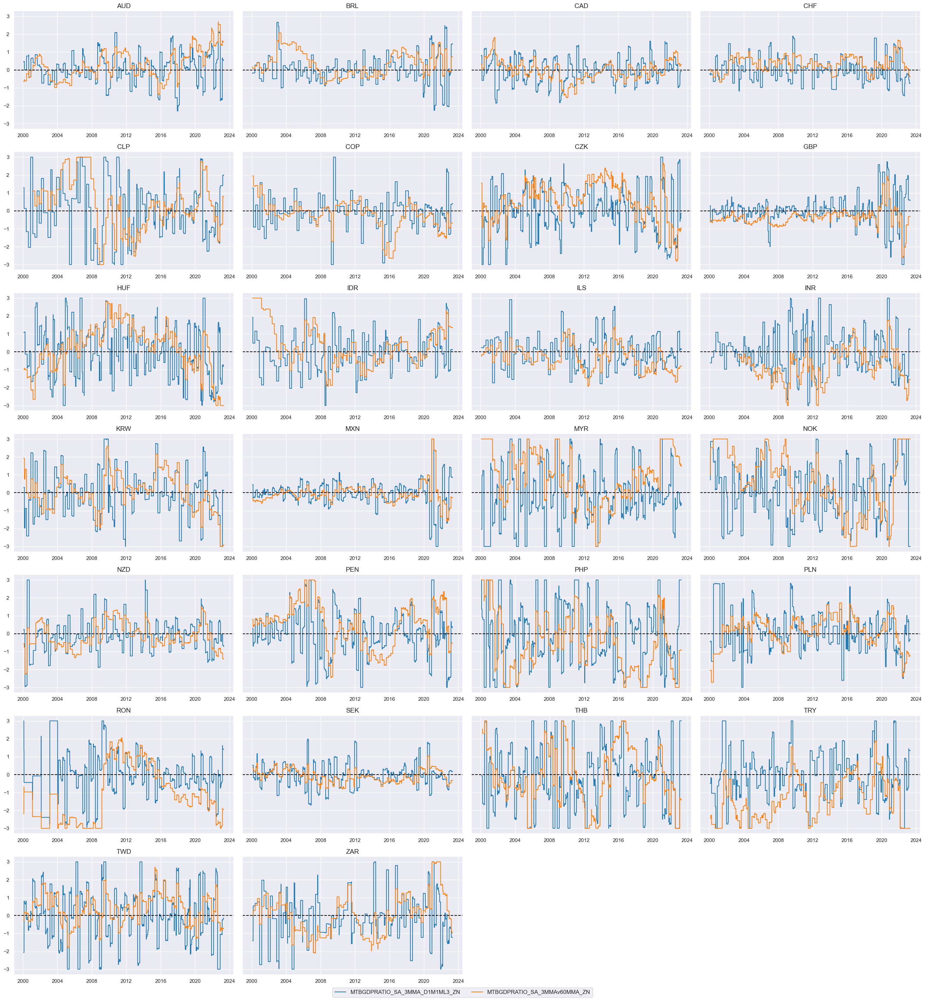

In [24]:
xcatx = ["MTBGDPRATIO_SA_3MMA_D1M1ML3_ZN", "MTBGDPRATIO_SA_3MMAv60MMA_ZN"]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=True,
    all_xticks=True,
)

### Relative growth trends

In the cell below we calculate the annual GDP growth trend relative to base currency area: 
- Euro ('CHF', 'CZK', 'HUF', 'NOK', 'PLN', 'RON', 'SEK'), 
- USD ('PEN',  'COP',  'IDR',  'THB',  'BRL',  'MXN',  'KRW',  'CAD',  'NZD',  'CLP',  'MYR',  'ZAR',  'AUD',  'TWD',  'INR',  'ILS',  'PHP')  or 
- a simple average of the two for ('GBP', 'TRY'). 

The new indicators get postfix `_vBM` for "versus Benchmark"

The two cells below calculate the Annual GDP growth trend relative to base currency area and displays its timeline for each cross-section.

In [25]:
grds = [xc for xc in gtds if "P1M1ML12_3MMA" in xc]
xcatx = grds

dfa = pd.DataFrame(columns=list(dfx.columns))
for xc in xcatx:
    calc_eur = [f"{xc}vBM = {xc} - iEUR_{xc}"]
    calc_usd = [f"{xc}vBM = {xc} - iUSD_{xc}"]
    calc_eud = [f"{xc}vBM = {xc} - 0.5 * ( iEUR_{xc} + iUSD_{xc} )"]

    dfa_eur = msp.panel_calculator(dfx, calcs=calc_eur, cids=cids_eur)
    dfa_usd = msp.panel_calculator(dfx, calcs=calc_usd, cids=cids_usd)
    dfa_eud = msp.panel_calculator(dfx, calcs=calc_eud, cids=cids_eud)

    dfa = msm.update_df(dfa, pd.concat([dfa_eur, dfa_usd, dfa_eud]))

dfx = msm.update_df(dfx, dfa)

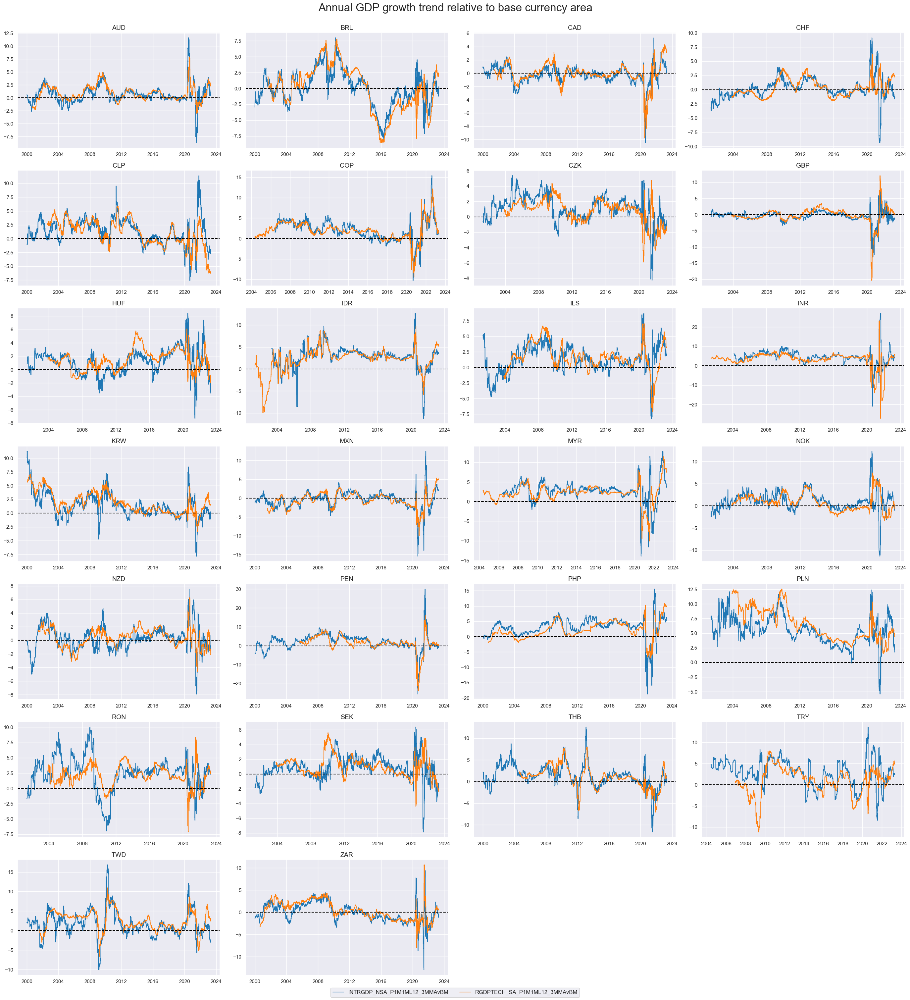

In [26]:
xcatx = ["INTRGDP_NSA_P1M1ML12_3MMAvBM", "RGDPTECH_SA_P1M1ML12_3MMAvBM"]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Annual GDP growth trend relative to base currency area",
    title_fontsize=24,
   
)

#### Scoring

The `macrosynergy` function `make_zn_scores()` normalizes the Annual GDP growth trend relative to the base currency area around zero adding `_ZN` postfix, so, for example, an original indicator `INTRGDP_NSA_P1M1ML12_3MMA` becomes `INTRGDP_NSA_P1M1ML12_3MMAvBM_ZN`, indicating that it is now a z-score of the Annual GDP growth trend relative to base currency area. The two cells below calculate the z-scores for the chosen indicators and display the timelines for the two selected indicators.

In [27]:
grdx = [xc + "vBM" for xc in grds]

xcatx = xbdx
cidx = cids_fx

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in grdx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

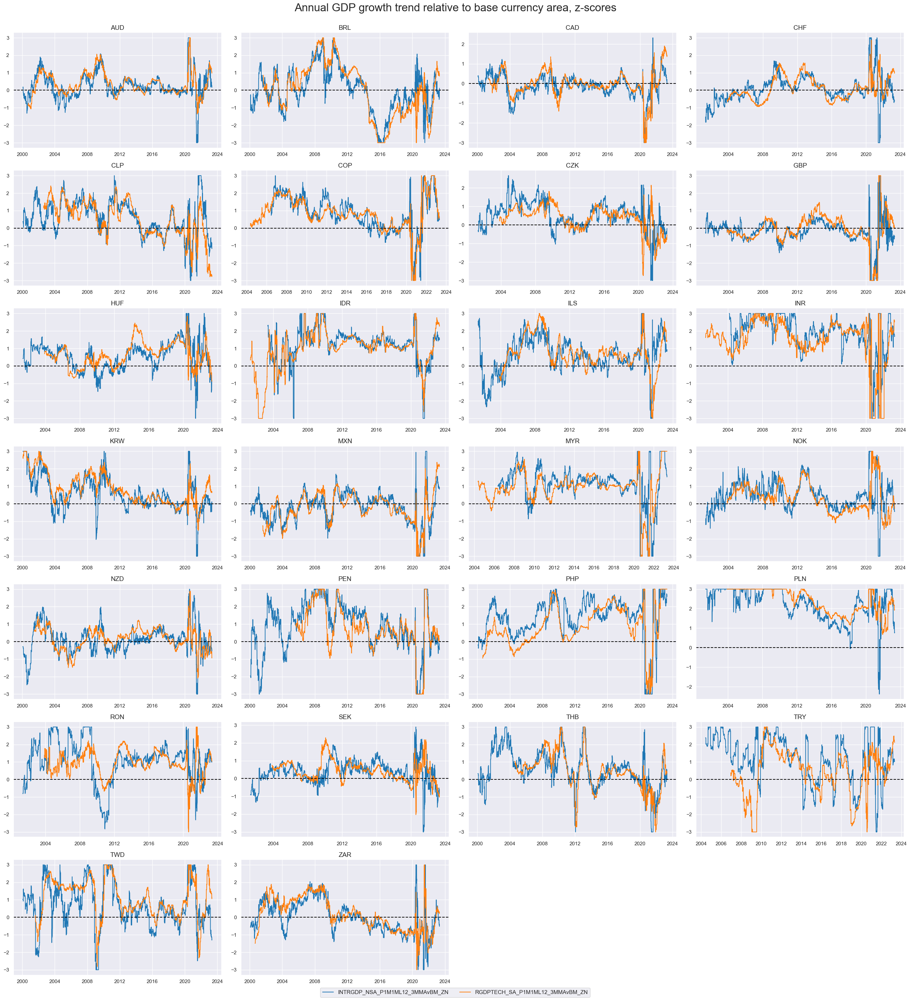

In [28]:
xcatx = ["INTRGDP_NSA_P1M1ML12_3MMAvBM_ZN", "RGDPTECH_SA_P1M1ML12_3MMAvBM_ZN"]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Annual GDP growth trend relative to base currency area, z-scores",
    title_fontsize=24,
    )

### Business confidence changes

As for the other groups - the External ratio changes and the Relative growth trends, we z-score the original business confidence indicators with `macrosynergy`'s `make_zn_scores` function and display the timelines for the selected 2 z-scores

In [29]:
msdx = ["MBCSCORE_SA_D3M3ML3", "MBCSCORE_SA_D6M6ML6"]

xcatx = xbdx
cidx = cids_fx

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in msdx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

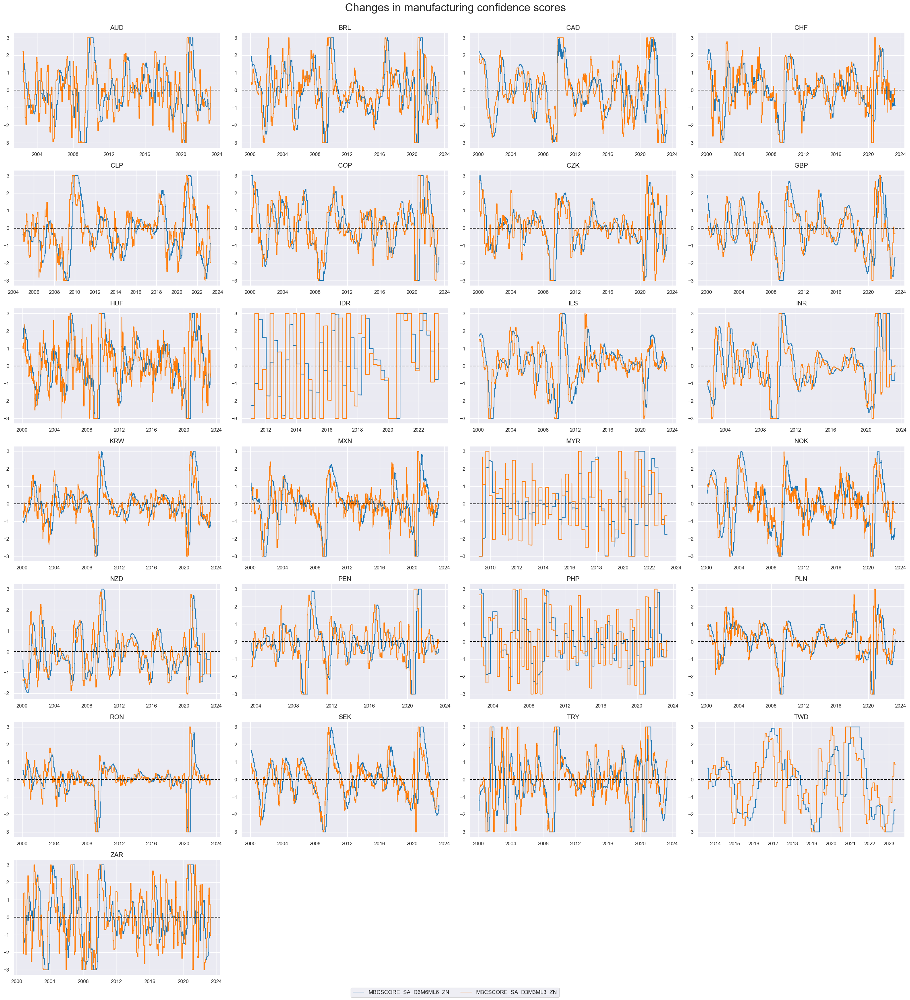

In [30]:
xcatx = ["MBCSCORE_SA_D6M6ML6_ZN", "MBCSCORE_SA_D3M3ML3_ZN"]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Changes in manufacturing confidence scores",
    title_fontsize=24,
    
)

### Terms-of-trade changes

As for previous groups of indicators (External ratio changes, Relative growth trends, and Business confidence changes), we z-score the Terms of trade changes, however, here we use here 50% of panel weight and 50% of individual cross-section since Terms of trade are not fully comparable. i.e. not homogenous across cross-sections. All other parameters are identical to the previous z-score calculations. The plot below displays z-scores for the commodity terms-of-trade dynamics

In [31]:
ttdx = ttds

xcatx = xbdx
cidx = cids_fx

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in ttdx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=0.5,  # 50% cross-section weight as ToT changes are not fully comparable
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

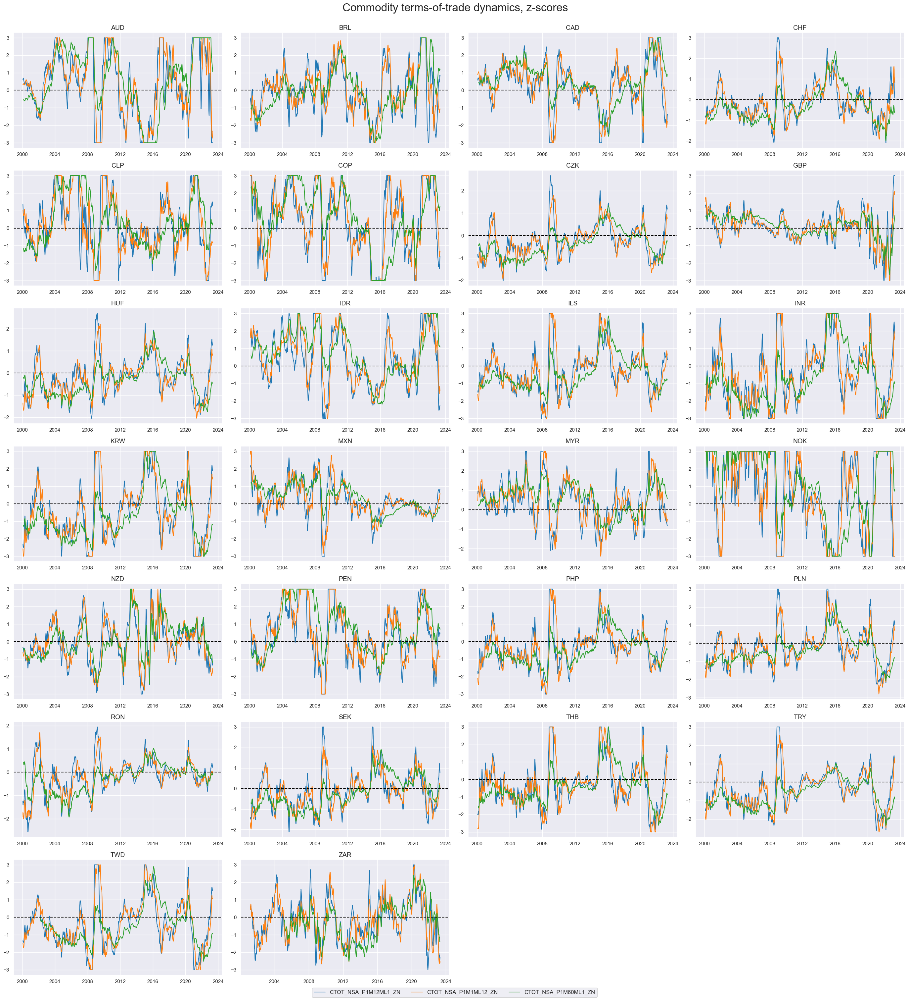

In [32]:
xcatx = [
    "CTOT_NSA_P1M12ML1_ZN",
    "CTOT_NSA_P1M1ML12_ZN",
    "CTOT_NSA_P1M60ML1_ZN",
]
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Commodity terms-of-trade dynamics, z-scores",
    title_fontsize=24,
   )

### External strength score

In this section, we combine the z-scores within each group to create Macro trend scores for 
- external balances, 
- economic growth (combining Intuitive growth estimates,  Technical real GDP trends, and Manufacturing confidence scores), and 
- terms-of-trade 

with the help of [`linear_composite()` function](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#calculate-linear-combinations-of-panels-with-linear-composite) from the `macrosynergy` package


In [33]:
xbdz = [xc + "_ZN" for xc in xbdx]
grdz = [xc + "_ZN" for xc in grdx] + [xc + "_ZN" for xc in msdx]
ttdz = [xc + "_ZN" for xc in ttdx]

In [34]:
dict_css = {
    "XBT_ALL_CZS": xbdz,
    "EGT_ALL_CZS": grdz,
    "TTD_ALL_CZS": ttdz,
}

xs = list(dict_css.keys())

In [35]:
cidx = cids_fx

dfa = pd.DataFrame(columns=list(dfx.columns))

for key, value in dict_css.items():
    dfaa = msp.linear_composite(
        df=dfx,
        xcats=value,
        cids=cidx,
        complete_xcats=False,
        new_xcat=key,
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

The new indicators then are re-scored again

In [36]:
xcatx = xs
cidx = cids_fx

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

The plots below display Macro trend scores for external balances, economic growth, and terms-of-trade for each cross-section

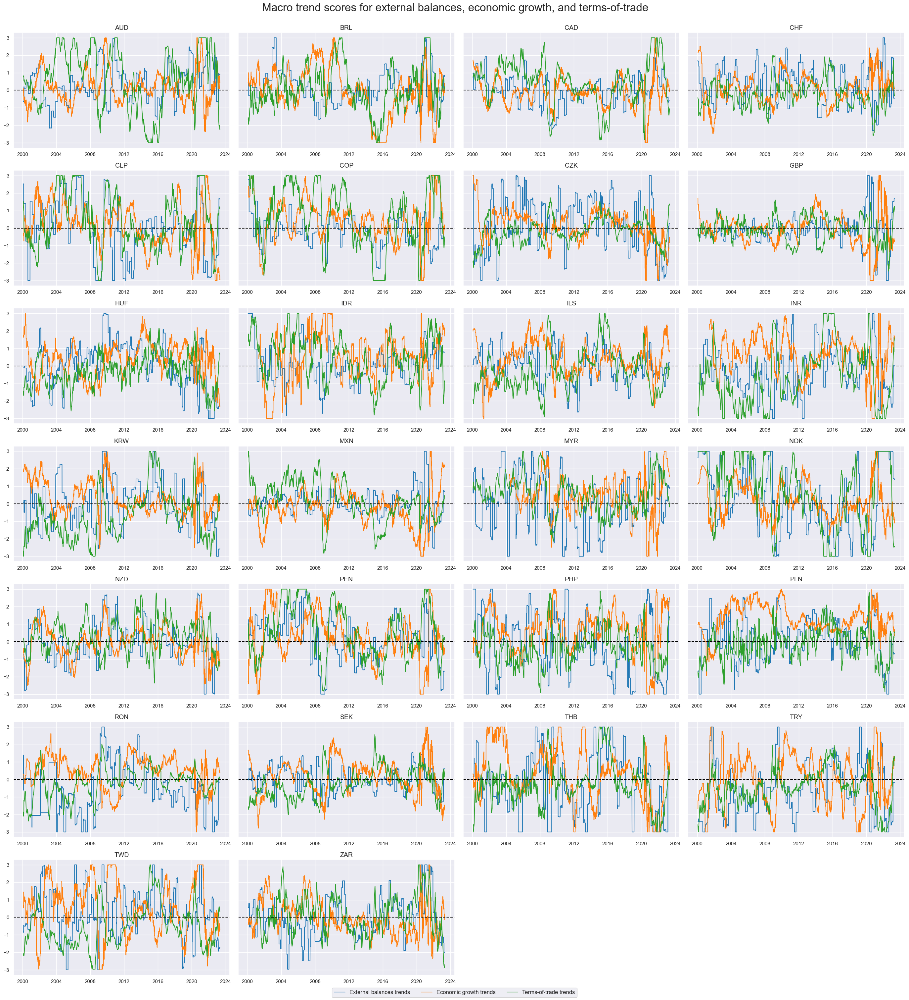

In [37]:
xsz = [xc + "_ZN" for xc in xs]

xcatx = xsz
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=True,
    all_xticks=True,
    title="Macro trend scores for external balances, economic growth, and terms-of-trade",
    xcat_labels=[
        "External balances trends",
        "Economic growth trends",
        "Terms-of-trade trends",
    ],
    title_fontsize=24,
   )

The below correlation matrix calculated with `correl_matrix()` function from the `macrosynergy` package shows monthly correlations across all constituents of the macro trends used in this post. These indicators are block-wise positively correlated, i.e., within the trend category they represent. However, there is not much correlation across blocks and even a negative tilt of correlation between growth trend indicators and external balance trend indicators. This illustrates the potential for diversification across concepts. Additional macro concepts could be applied to the present pure macro-FX strategy, such as labor market tightness, producer price growth, credit growth, or international investment positions. Beyond plausibility and evidence for direct predictive power, an important criterion for extending a model is low correlation and different seasons relative to the existing set.

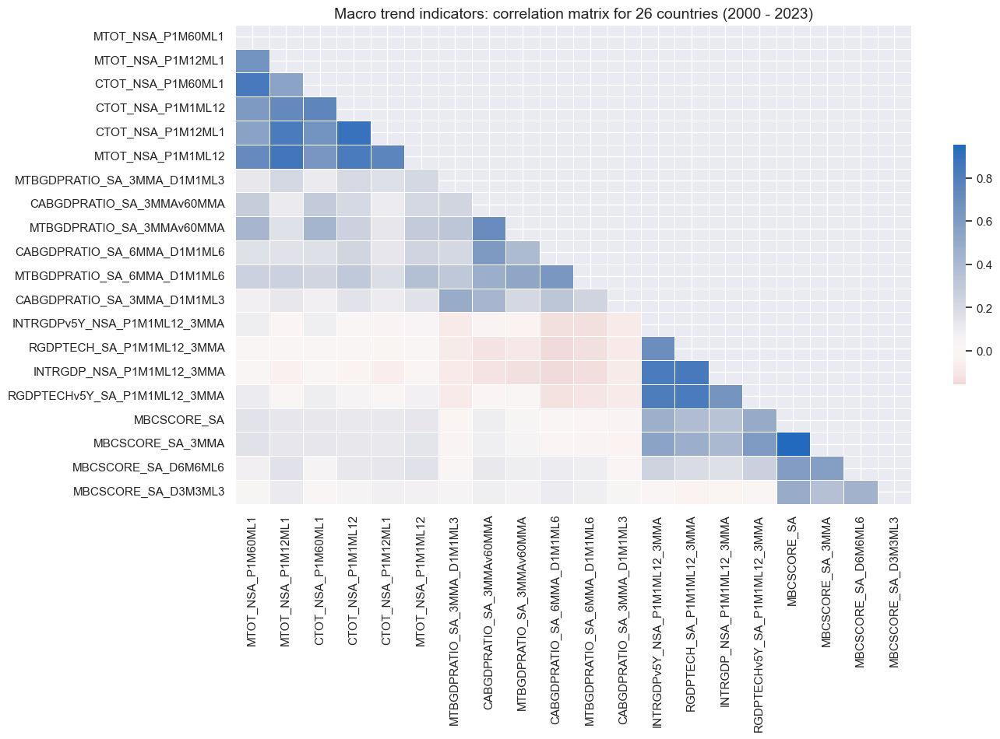

In [38]:
xcatx = xbds + grds + msds + ttds

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    freq="M",
    cids=cids_fx,
    size=(14, 8),
    cluster=True,
    title="Macro trend indicators: correlation matrix for 26 countries (2000 - 2023)",
)

#### Combining trends across sectors

Then the group scores are combined with equal weights, preserving the principle of “conceptual risk parity.”

In [39]:
xsz = [xc + "_ZN" for xc in xs]
dict_xsz = {
    "XS_ALL_CZS": [xc for xc in xsz],
    "XS_XBGR_CZS": [xc for xc in xsz if "TTD" not in xc],
    "XS_XBTT_CZS": [xc for xc in xsz if "EGT" not in xc],
    "XS_GRTT_CZS": [xc for xc in xsz if "XBT" not in xc],
}

xs_czs = list(dict_xsz.keys())

In [40]:
cidx = cids_fx

dfa = pd.DataFrame(columns=list(dfx.columns))

for key, value in dict_xsz.items():
    dfaa = msp.linear_composite(
        df=dfx,
        xcats=value,
        cids=cidx,
        complete_xcats=False,
        new_xcat=key,
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

The cell below displays the timeline for the Composite external strength score. The external strength score is a plausible predictor of volatility-targeted FX forward returns. 

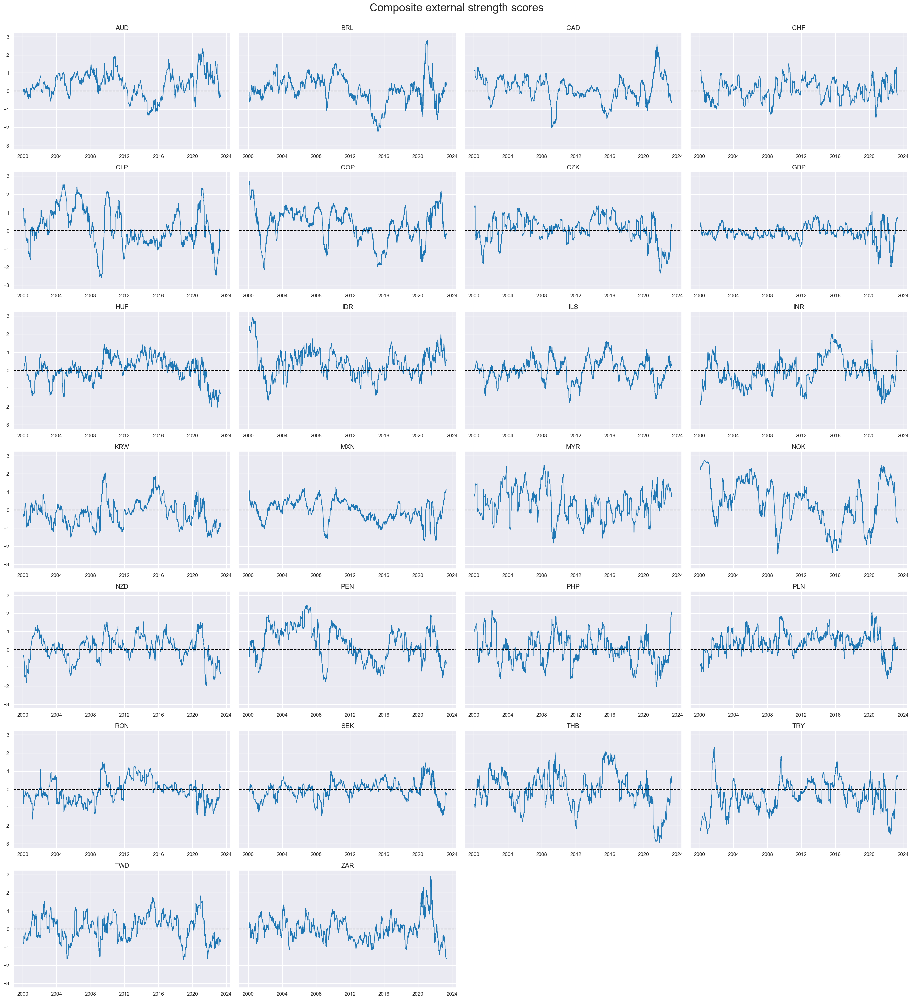

In [41]:
xcatx = "XS_ALL_CZS"
cidx = cids_fx
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=True,
    all_xticks=True,
    title="Composite external strength scores",
    title_fontsize=24,
)

The `correl_matrix() function` visualizes Pearson correlation across different cross-sections for the external strength score indicator. External strength scores post both negative and positive correlation across countries, and high positive correlation is rare. This means that signal diversity can still mitigate risk concentration.

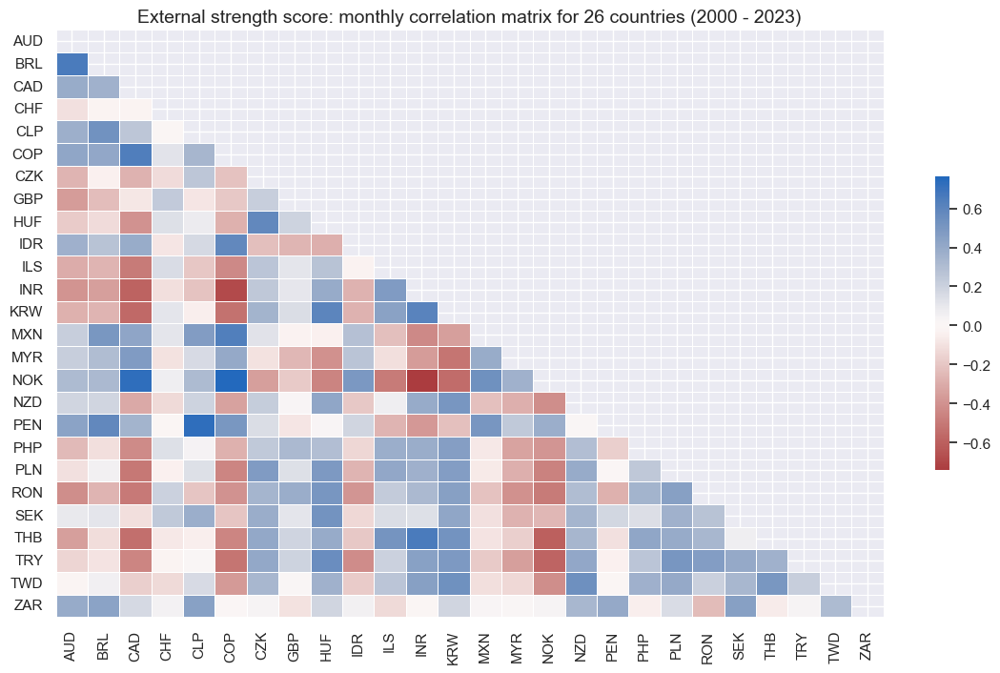

In [42]:
msp.correl_matrix(
    dfx,
    xcats="XS_ALL_CZS",
    freq="M",
    cids=cids_fx,
    size=(14, 8),
    cluster=False,
    title="External strength score: monthly correlation matrix for 26 countries (2000 - 2023)",
)

## Targets

We choose as target `FXXR_VT10` (Vol-targeted FX forward return). Please see here for the description of [FX forward returns indicators](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/FX%20forward%20returns.php)

Below correlation matrix of volatility targeted weekly FX forward returns across the 26 developed and emerging market currencies sows mostly positive correlation between returns, however, the coefficients are mostly below 50% and often near zero or negative.

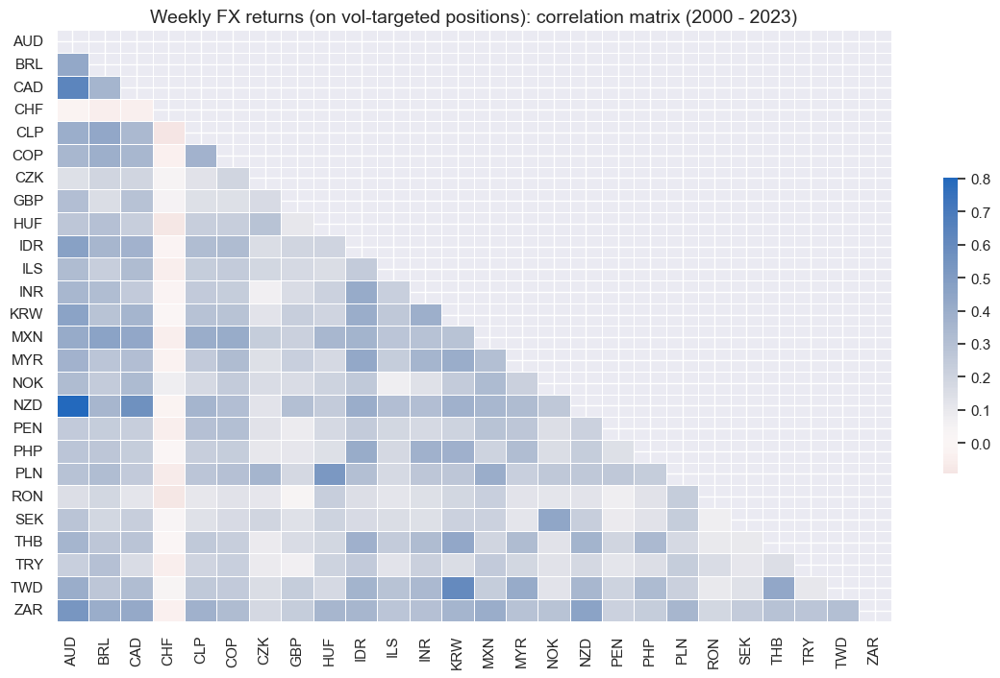

In [43]:
msp.correl_matrix(
    df,
    xcats="FXXR_VT10",
    freq="W",
    cids=cids_fx,
    size=(14, 8),
    cluster=False,
    title="Weekly FX returns (on vol-targeted positions): correlation matrix (2000 - 2023)",
)

# Value checks

## External strength

### Global composites

#### Specs and panel tests

This section uses extensively the following classes of the `macrosynergy` package:

- [`CategoryRelations()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#relating)
- [`SignalReturnRelations`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#signalreturnrelations)
- [`NaivePnL`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#naivepnl)

In [44]:
sigs = [xc for xc in set(xs_czs + xsz) if "ALL" in xc]

ms = "XS_ALL_CZS"  # main signal
oths = sorted(list(set(sigs) - set([ms])))  # other signals

targ = "FXXR_VT10"
cidx = cids_fx
start = "2000-01-01"

dict_xs = {
    "sig": ms,
    "rivs": oths,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

Panel regression shows a positive relation between end-of-month information states of external strength and subsequent weekly and monthly vol-targeted FX returns. The test suggests that the probability of this relation being systematic rather than accidental is around 99%.

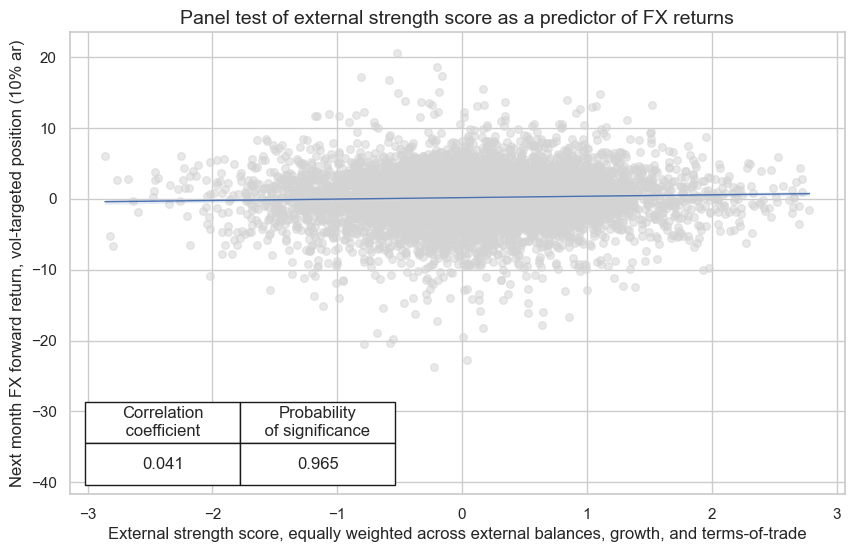

In [45]:
dix = dict_xs

sig = dix["sig"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
    blacklist=blax,
)
crx.reg_scatter(
    labels=False,
    coef_box="lower left",
    xlab="External strength score, equally weighted across external balances, growth, and terms-of-trade",
    ylab="Next month FX forward return, vol-targeted position (10% ar)",
    title="Panel test of external strength score as a predictor of FX returns",
    size=(10, 6),
    prob_est="map",
)

#### Accuracy and correlation check

In [46]:
dix = dict_xs

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    rets=targ,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

In [47]:
dix = dict_xs
srrx = dix["srr"]
display(srrx.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
M: XS_ALL_CZS/last => FXXR_VT10,0.525,0.520,0.554,0.547,0.565,0.475,0.041,0.001,0.028,0.000,0.520
Mean years,0.524,0.509,0.549,0.547,0.558,0.461,0.017,0.474,0.011,0.482,0.510
Positive ratio,0.750,0.625,0.625,0.708,0.708,0.333,0.667,0.375,0.542,0.333,0.625
Mean cids,0.523,0.518,0.550,0.549,0.566,0.471,0.036,0.386,0.022,0.409,0.518
Positive ratio,0.692,0.654,0.615,0.885,0.846,0.192,0.731,0.462,0.615,0.423,0.654


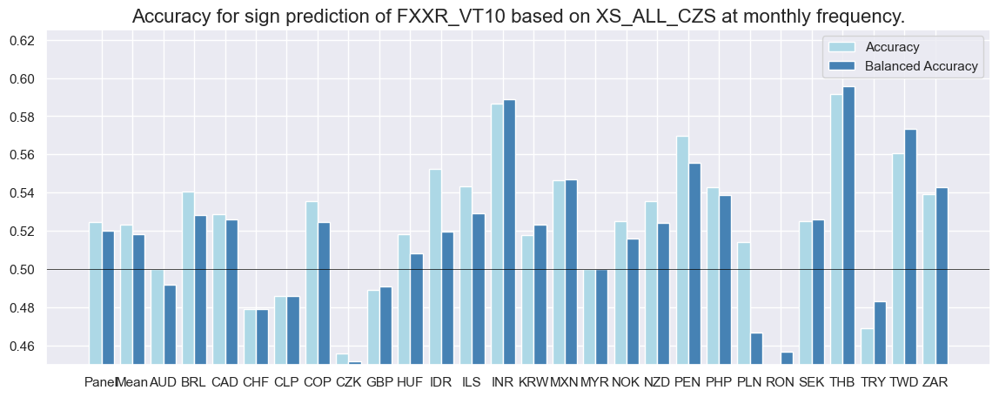

In [48]:
dix = dict_xs
srrx = dix["srr"]
srr.accuracy_bars(type="cross_section", size=(14, 5))

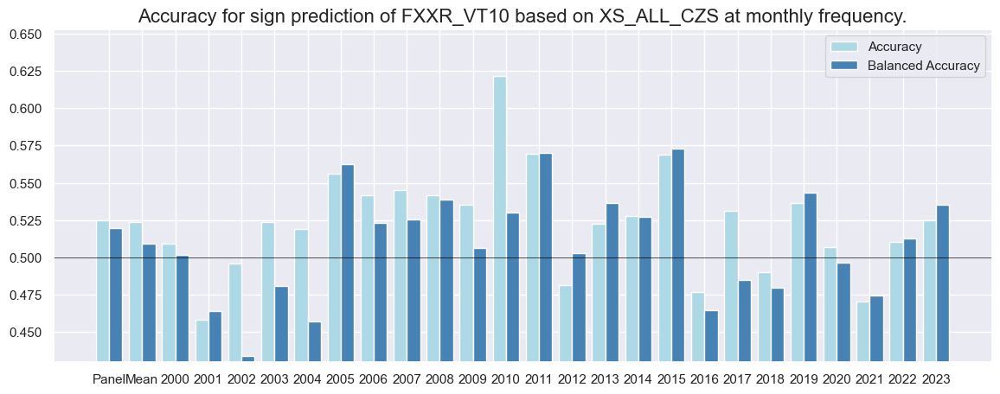

In [49]:
dix = dict_xs
srrx = dix["srr"]
srr.accuracy_bars(type="years", size=(14, 5))

The table and bars below compare the accuracy of the composite external strength score with its constituents (external balances, economic growth, and terms-of-trade) 

In [50]:
dix = dict_xs
srrx = dix["srr"]
display(srrx.signals_table().sort_index().astype("float").round(3))

accuracy  bal_accuracy  \
Return    Signal         Frequency Aggregation                           
FXXR_VT10 EGT_ALL_CZS_ZN M         last            0.512         0.504   
          TTD_ALL_CZS_ZN M         last            0.510         0.513   
          XBT_ALL_CZS_ZN M         last            0.518         0.518   
          XS_ALL_CZS     M         last            0.525         0.520   

                                                pos_sigr  pos_retr  pos_prec  \
Return    Signal         Frequency Aggregation                                 
FXXR_VT10 EGT_ALL_CZS_ZN M         last            0.587     0.547     0.550   
          TTD_ALL_CZS_ZN M         last            0.476     0.547     0.561   
          XBT_ALL_CZS_ZN M         last            0.495     0.547     0.565   
          XS_ALL_CZS     M         last            0.554     0.547     0.565   

                                                neg_prec  pearson  \
Return    Signal         Frequency Aggregation                      
FXXR_VT10 EGT_ALL_CZS_ZN M         last            0.458    0.032   
          TTD_ALL_CZS_ZN M         last            0.465    0.029   
          XBT_ALL_CZS_ZN M         last            0.471    0.018   
          XS_ALL_CZS     M         last            0.475    0.041   

                                                pearson_pval  kendall  \
Return    Signal         Frequency Aggregation                          
FXXR_VT10 EGT_ALL_CZS_ZN M         last                0.009    0.018   
          TTD_ALL_CZS_ZN M         last                0.016    0.015   
          XBT_ALL_CZS_ZN M         last                0.143    0.014   
          XS_ALL_CZS     M         last                0.001    0.028   

                                                kendall_pval    auc  
Return    Signal         Frequency Aggregation                       
FXXR_VT10 EGT_ALL_CZS_ZN M         last                0.029  0.504  
          TTD_ALL_CZS_ZN M         last                0.060  0.513  
          XBT_ALL_CZS_ZN M         last                0.092  0.518  
          XS_ALL_CZS     M         last                0.000  0.520

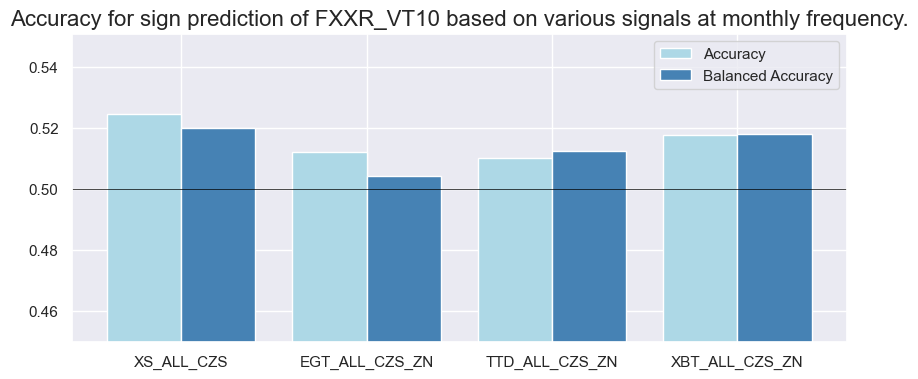

In [51]:
srr.accuracy_bars(type="signals", size=(10, 4))

#### Naive PnL

In [52]:
dix = dict_xs

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    # bms=["USD_EQXR_NSA", "USD_GB10YXR_NSA", "EUR_FXXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls"] = naive_pnl

We estimate the economic value of a composite external strength score based on a naïve PnL computed according to a standard procedure used in Macrosynergy research posts. A naive PnL is calculated for simple monthly rebalancing in accordance with the external strength score at the end of each month as the basis for the positions of the next month and under consideration of a 1-day slippage for trading. The trading signals are capped at 2 standard deviations in either direction for each currency as a reasonable risk limit, and applied to volatility-targeted positions. This means that one unit of signal translates into one unit of risk (approximated by estimated return volatility) for each currency. The naïve PnL does not consider transaction costs or compounding. For the chart below, the PnL has been scaled to an annualized volatility of 10%

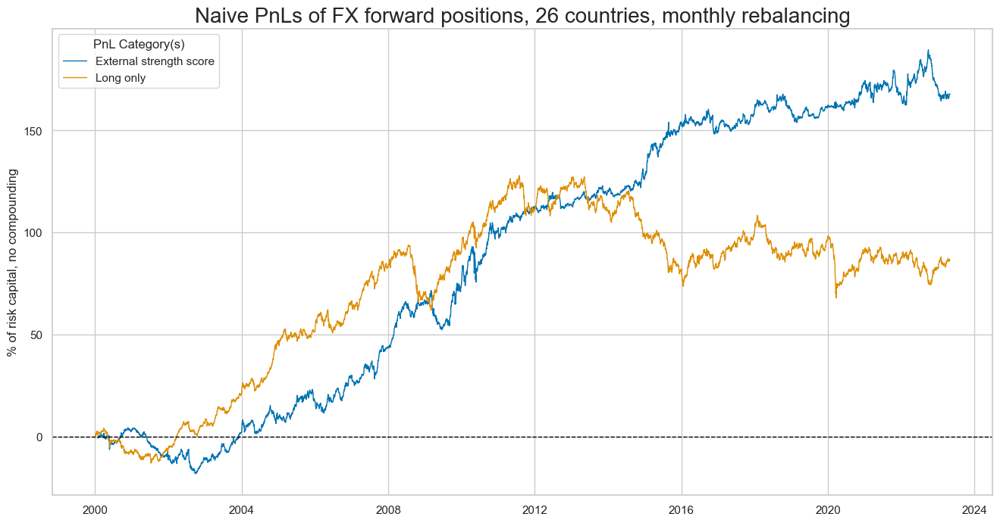

In [53]:
dix = dict_xs

start = dix["start"]
cidx = dix["cidx"]
sigx = [dix["sig"]]

naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx] + ["Long only"]
dict_labels={"XS_ALL_CZS_PZN":"External strength score", 
             "Long only":"Long only"}

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnLs of FX forward positions, 26 countries, monthly rebalancing",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

All three types of macro trends have contributed to PnL generation but in different “seasons.” Economic growth trends played an important role in predictive FX trends in the 2000s but have generated only modest value since 2010. Conversely, external trade trends produced no value in the 2000s but greatly added to PnL generation in the 2010s and 2020s. The mirror image of these probably is not accidental: in times of strong international capital flows, high-growth economies tend to attract FX inflows even if their external balances deteriorate, while in times of financial shocks and de-globalization, external deficits are a greater concern. The important point is that jointly these two trends produced consistent value. Finally, terms-of-trades have helped PnL generation across decades, but naturally only in episodes where international commodity prices changed significantly.

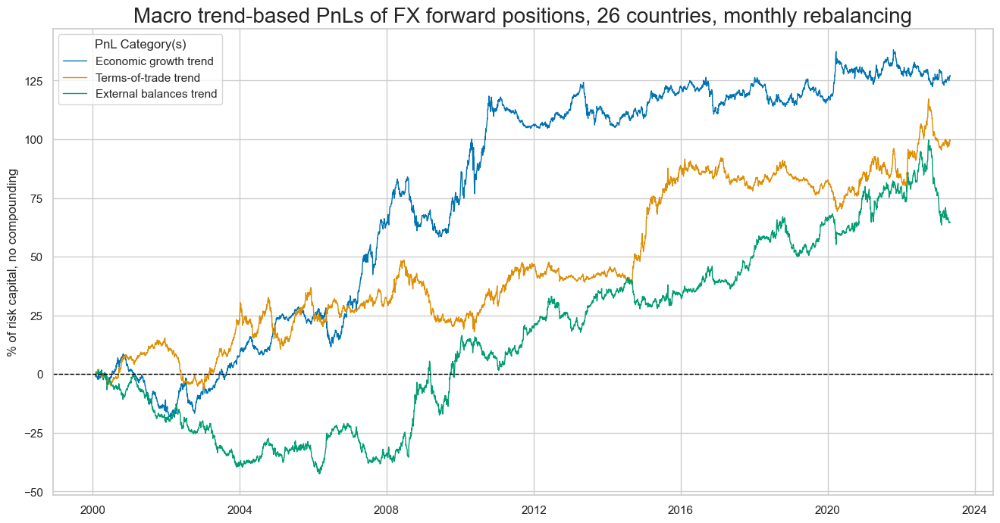

In [54]:
dix = dict_xs

start = dix["start"]
cidx = dix["cidx"]
sigx = dix["rivs"]

naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]

dict_labels = {"EGT_ALL_CZS_ZN_PZN": "Economic growth trend", 
               "TTD_ALL_CZS_ZN_PZN": "Terms-of-trade trend", 
               "XBT_ALL_CZS_ZN_PZN": "External balances trend"}

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Macro trend-based PnLs of FX forward positions, 26 countries, monthly rebalancing",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

In [55]:
dix = dict_xs

start = dix["start"]
sigx = [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,Traded Months
xcat,,,,,,,
EGT_ALL_CZS_ZN_PZN,5.475556,10.0,0.547556,0.775122,-23.256558,-19.794332,281
TTD_ALL_CZS_ZN_PZN,4.273334,10.0,0.427333,0.611015,-13.513636,-19.221181,281
XBT_ALL_CZS_ZN_PZN,2.785744,10.0,0.278574,0.398947,-14.955581,-33.844763,281
XS_ALL_CZS_PZN,7.22627,10.0,0.722627,1.043348,-17.443455,-24.157188,281


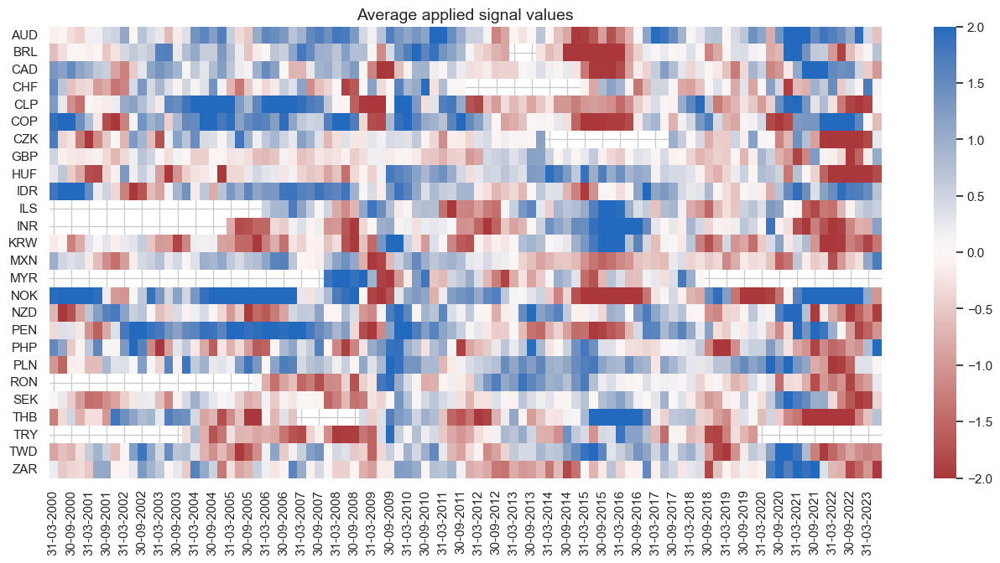

In [56]:
dix = dict_xs

start = dix["start"]
sig = dix["sig"]
naive_pnl = dix["pnls"]

naive_pnl.signal_heatmap(pnl_name=sig + "_PZN", freq="q", start=start, figsize=(16, 7))

### Developed markets

#### Specs and panel tests

Here we consider a simple trading strategy based on the external strength score and on its constituents for the 7 developed market currencies alone [cids_dmfx ='GBP', 'AUD', 'NOK', 'SEK', 'NZD', 'CAD', 'CHF']. Trading developed markets with macro trends may be more convenient and has also been profitable. However, the below chart shows that a developed market FX strategy would have produced less than half the risk-adjusted return of the global portfolio, with a Sharpe ratio of just 0.33., and greater seasonality. 

In [57]:
sigs = [xc for xc in set(xs_czs + xsz)]

ms = "XS_ALL_CZS"  # main signal
oths = sorted(list(set(sigs) - set([ms])))  # other signals

targ = "FXXR_VT10"
cidx = cids_dmfx
start = "2000-01-01"

dict_xsdm = {
    "sig": ms,
    "rivs": oths,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

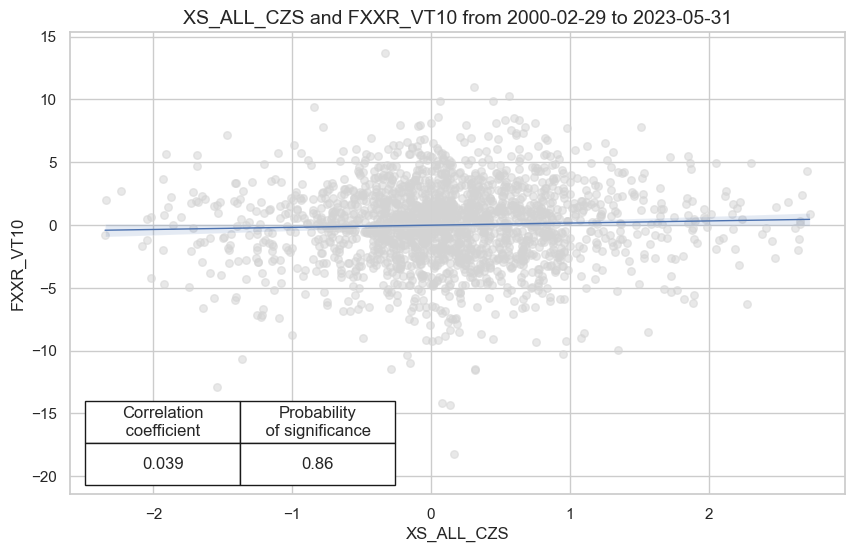

In [58]:
dix = dict_xsdm

sig = dix["sig"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
    blacklist=blax,
)
crx.reg_scatter(
    labels=False,
    coef_box="lower left",
    xlab=None,
    ylab=None,
    title=None,
    size=(10, 6),
    prob_est="map",
)

#### Accuracy and correlation check

In [59]:
dix = dict_xsdm

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    rets=targ,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

In [60]:
dix = dict_xsdm
srrx = dix["srr"]
display(srrx.summary_table().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
M: XS_ALL_CZS/last => FXXR_VT10,0.512,0.510,0.567,0.520,0.528,0.492,0.039,0.091,0.018,0.244,0.510
Mean years,0.513,0.503,0.561,0.517,0.523,0.483,0.020,0.505,0.004,0.565,0.502
Positive ratio,0.542,0.458,0.625,0.458,0.542,0.500,0.625,0.375,0.625,0.208,0.458
Mean cids,0.512,0.508,0.565,0.519,0.525,0.490,0.041,0.524,0.013,0.612,0.508
Positive ratio,0.571,0.571,0.857,0.714,0.714,0.286,0.714,0.429,0.429,0.286,0.571


In [61]:
dix = dict_xsdm
srrx = dix["srr"]
display(srrx.signals_table().sort_index().astype("float").round(3))

accuracy  bal_accuracy  \
Return    Signal         Frequency Aggregation                           
FXXR_VT10 EGT_ALL_CZS_ZN M         last            0.521         0.521   
          TTD_ALL_CZS_ZN M         last            0.511         0.510   
          XBT_ALL_CZS_ZN M         last            0.498         0.497   
          XS_ALL_CZS     M         last            0.512         0.510   
          XS_GRTT_CZS    M         last            0.528         0.526   
          XS_XBGR_CZS    M         last            0.512         0.511   
          XS_XBTT_CZS    M         last            0.506         0.504   

                                                pos_sigr  pos_retr  pos_prec  \
Return    Signal         Frequency Aggregation                                 
FXXR_VT10 EGT_ALL_CZS_ZN M         last            0.506      0.52     0.540   
          TTD_ALL_CZS_ZN M         last            0.547      0.52     0.529   
          XBT_ALL_CZS_ZN M         last            0.521      0.52     0.517   
          XS_ALL_CZS     M         last            0.567      0.52     0.528   
          XS_GRTT_CZS    M         last            0.551      0.52     0.543   
          XS_XBGR_CZS    M         last            0.529      0.52     0.531   
          XS_XBTT_CZS    M         last            0.554      0.52     0.523   

                                                neg_prec  pearson  \
Return    Signal         Frequency Aggregation                      
FXXR_VT10 EGT_ALL_CZS_ZN M         last            0.501    0.070   
          TTD_ALL_CZS_ZN M         last            0.491    0.025   
          XBT_ALL_CZS_ZN M         last            0.477   -0.010   
          XS_ALL_CZS     M         last            0.492    0.039   
          XS_GRTT_CZS    M         last            0.509    0.059   
          XS_XBGR_CZS    M         last            0.492    0.035   
          XS_XBTT_CZS    M         last            0.485    0.011   

                                                pearson_pval  kendall  \
Return    Signal         Frequency Aggregation                          
FXXR_VT10 EGT_ALL_CZS_ZN M         last                0.002    0.047   
          TTD_ALL_CZS_ZN M         last                0.265    0.013   
          XBT_ALL_CZS_ZN M         last                0.648   -0.014   
          XS_ALL_CZS     M         last                0.091    0.018   
          XS_GRTT_CZS    M         last                0.010    0.040   
          XS_XBGR_CZS    M         last                0.125    0.013   
          XS_XBTT_CZS    M         last                0.623    0.002   

                                                kendall_pval    auc  
Return    Signal         Frequency Aggregation                       
FXXR_VT10 EGT_ALL_CZS_ZN M         last                0.002  0.521  
          TTD_ALL_CZS_ZN M         last                0.390  0.510  
          XBT_ALL_CZS_ZN M         last                0.356  0.497  
          XS_ALL_CZS     M         last                0.244  0.510  
          XS_GRTT_CZS    M         last                0.009  0.526  
          XS_XBGR_CZS    M         last                0.390  0.511  
          XS_XBTT_CZS    M         last                0.890  0.504

#### Naive PnL

In [62]:
dix = dict_xsdm

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    # bms=["USD_EQXR_NSA", "USD_GB10YXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=3,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls"] = naive_pnl

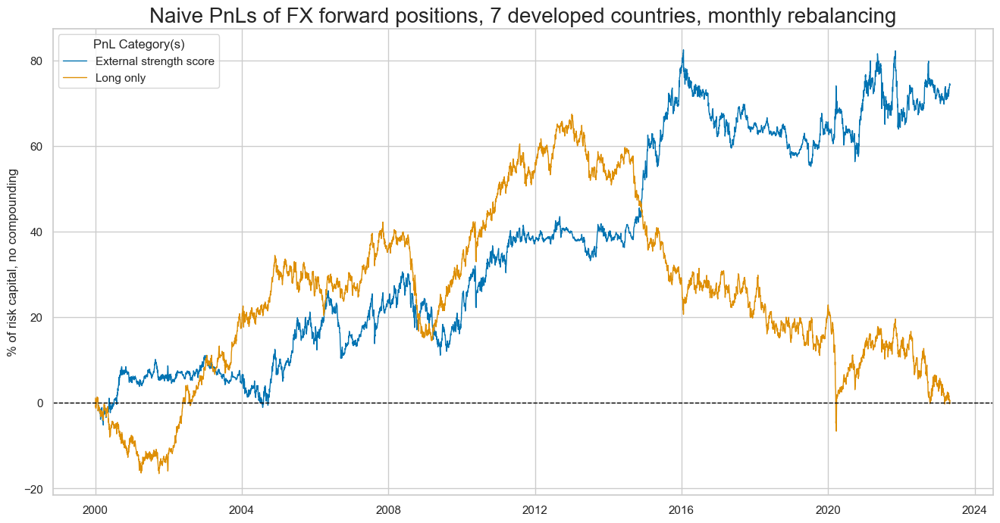

In [63]:
dix = dict_xsdm

start = dix["start"]
cidx = dix["cidx"]
sigx = [dix["sig"]]
naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx] + ["Long only"]

dict_labels = {"XS_ALL_CZS_PZN": "External strength score", 
               "Long only": "Long only"}


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive PnLs of FX forward positions, 7 developed countries, monthly rebalancing",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

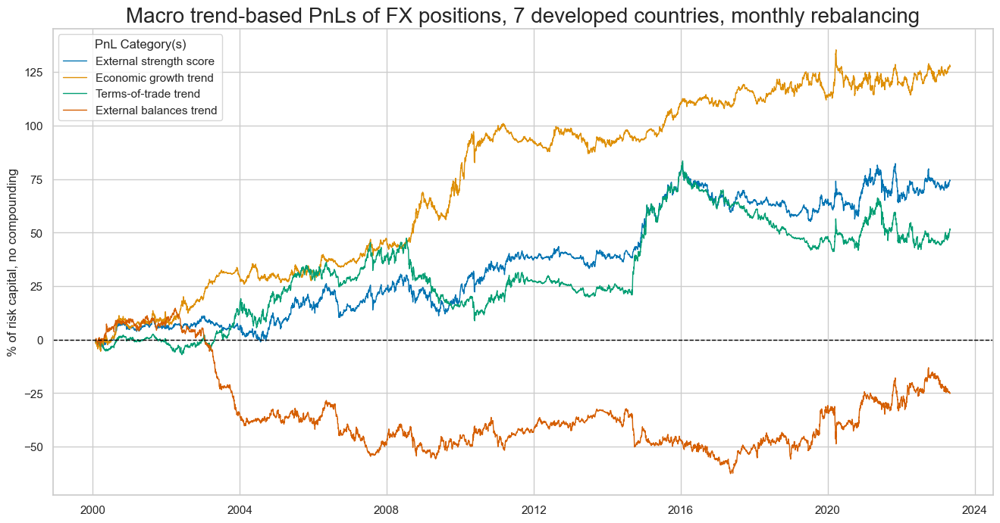

In [64]:
dix = dict_xsdm

start = dix["start"]
cidx = dix["cidx"]
sigx = [dix["sig"]] + [s for s in dix["rivs"] if "ALL" in s]

naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]


dict_labels = {"XS_ALL_CZS_PZN": "External strength score", 
               "EGT_ALL_CZS_ZN_PZN": "Economic growth trend", 
               "TTD_ALL_CZS_ZN_PZN": "Terms-of-trade trend", 
               "XBT_ALL_CZS_ZN_PZN": "External balances trend"}


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Macro trend-based PnLs of FX positions, 7 developed countries, monthly rebalancing",
    xcat_labels=dict_labels,
    figsize=(16, 8),
)

In [65]:
dix = dict_xsdm

start = dix["start"]
sigx = [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,Traded Months
xcat,,,,,,,
EGT_ALL_CZS_ZN_PZN,5.489587,10.0,0.548959,0.78231,-13.498375,-13.127616,281
TTD_ALL_CZS_ZN_PZN,2.206063,10.0,0.220606,0.308691,-14.324002,-18.955841,281
XBT_ALL_CZS_ZN_PZN,-1.076224,10.0,-0.107622,-0.149761,-15.627546,-28.508843,281
XS_ALL_CZS_PZN,3.19585,10.0,0.319585,0.44503,-17.804034,-14.905276,281
XS_GRTT_CZS_PZN,4.486183,10.0,0.448618,0.625586,-15.494452,-16.292951,281
XS_XBGR_CZS_PZN,2.795656,10.0,0.279566,0.392013,-16.832789,-15.82962,281
XS_XBTT_CZS_PZN,0.915451,10.0,0.091545,0.128197,-15.958374,-19.479475,281


### Individual signals

#### Specs and panel tests

In [66]:
allzs = xbdz + ttdz + grdz
sigs = allzs

ms = "XS_ALL_CZS"  # main signal
oths = sorted(list(set(sigs) - set([ms])))  # other signals

targ = "FXXR_VT10"
cidx = set(cids_fx) - set(["THB", "RON"])  # countries which do not have all the data
start = "2000-01-01"

dict_allzs = {
    "sig": ms,
    "rivs": oths,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

#### Accuracy and correlation check

In [68]:
dix = dict_allzs

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=list(cidx),
    sigs=[sig] + rivs,
    rets=targ,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

In [69]:
dix = dict_allzs
srrx = dix["srr"]
display(srrx.signals_table().sort_index().astype("float").round(3))

accuracy  \
Return    Signal                             Frequency Aggregation             
FXXR_VT10 CABGDPRATIO_SA_3MMA_D1M1ML3_ZN     M         last            0.508   
          CABGDPRATIO_SA_3MMAv60MMA_ZN       M         last            0.514   
          CABGDPRATIO_SA_6MMA_D1M1ML6_ZN     M         last            0.493   
          CTOT_NSA_P1M12ML1_ZN               M         last            0.507   
          CTOT_NSA_P1M1ML12_ZN               M         last            0.513   
          CTOT_NSA_P1M60ML1_ZN               M         last            0.513   
          INTRGDP_NSA_P1M1ML12_3MMAvBM_ZN    M         last            0.528   
          INTRGDPv5Y_NSA_P1M1ML12_3MMAvBM_ZN M         last            0.511   
          MBCSCORE_SA_D3M3ML3_ZN             M         last            0.501   
          MBCSCORE_SA_D6M6ML6_ZN             M         last            0.497   
          MTBGDPRATIO_SA_3MMA_D1M1ML3_ZN     M         last            0.511   
          MTBGDPRATIO_SA_3MMAv60MMA_ZN       M         last            0.512   
          MTBGDPRATIO_SA_6MMA_D1M1ML6_ZN     M         last            0.516   
          MTOT_NSA_P1M12ML1_ZN               M         last            0.501   
          MTOT_NSA_P1M1ML12_ZN               M         last            0.503   
          MTOT_NSA_P1M60ML1_ZN               M         last            0.515   
          RGDPTECH_SA_P1M1ML12_3MMAvBM_ZN    M         last            0.529   
          RGDPTECHv5Y_SA_P1M1ML12_3MMAvBM_ZN M         last            0.504   
          XS_ALL_CZS                         M         last            0.524   

                                                                    bal_accuracy  \
Return    Signal                             Frequency Aggregation                 
FXXR_VT10 CABGDPRATIO_SA_3MMA_D1M1ML3_ZN     M         last                0.509   
          CABGDPRATIO_SA_3MMAv60MMA_ZN       M         last                0.512   
          CABGDPRATIO_SA_6MMA_D1M1ML6_ZN     M         last                0.493   
          CTOT_NSA_P1M12ML1_ZN               M         last                0.510   
          CTOT_NSA_P1M1ML12_ZN               M         last                0.516   
          CTOT_NSA_P1M60ML1_ZN               M         last                0.517   
          INTRGDP_NSA_P1M1ML12_3MMAvBM_ZN    M         last                0.513   
          INTRGDPv5Y_NSA_P1M1ML12_3MMAvBM_ZN M         last                0.512   
          MBCSCORE_SA_D3M3ML3_ZN             M         last                0.502   
          MBCSCORE_SA_D6M6ML6_ZN             M         last                0.498   
          MTBGDPRATIO_SA_3MMA_D1M1ML3_ZN     M         last                0.512   
          MTBGDPRATIO_SA_3MMAv60MMA_ZN       M         last                0.512   
          MTBGDPRATIO_SA_6MMA_D1M1ML6_ZN     M         last                0.517   
          MTOT_NSA_P1M12ML1_ZN               M         last                0.501   
          MTOT_NSA_P1M1ML12_ZN               M         last                0.503   
          MTOT_NSA_P1M60ML1_ZN               M         last                0.513   
          RGDPTECH_SA_P1M1ML12_3MMAvBM_ZN    M         last                0.513   
          RGDPTECHv5Y_SA_P1M1ML12_3MMAvBM_ZN M         last                0.507   
          XS_ALL_CZS                         M         last                0.520   

                                                                    pos_sigr  \
Return    Signal                             Frequency Aggregation             
FXXR_VT10 CABGDPRATIO_SA_3MMA_D1M1ML3_ZN     M         last            0.497   
          CABGDPRATIO_SA_3MMAv60MMA_ZN       M         last            0.533   
          CABGDPRATIO_SA_6MMA_D1M1ML6_ZN     M         last            0.498   
          CTOT_NSA_P1M12ML1_ZN               M         last            0.469   
          CTOT_NSA_P1M1ML12_ZN               M         last            0.466   
          CTOT_NSA_P1M60ML1_ZN               M         last   

#### Naive PnL

The diversified risk parity signal would have outperformed not only all three major macro trend signals but also each and every signal based on any of the 18 underlying constituents. The chart below compares the performance naïve PnLs of the parity-based diversified external strength score and all trend constituents, i.e., all the individual quantamental series (normalized) behind the three main macro trends. Even the best score chosen with hindsight (merchandise trade balance trend) would only have produced a Sharpe of 0.56 versus 0.77 for the composite.

In [70]:
dix = dict_allzs

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    #   bms=["USD_EQXR_NSA", "USD_GB10YXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls"] = naive_pnl

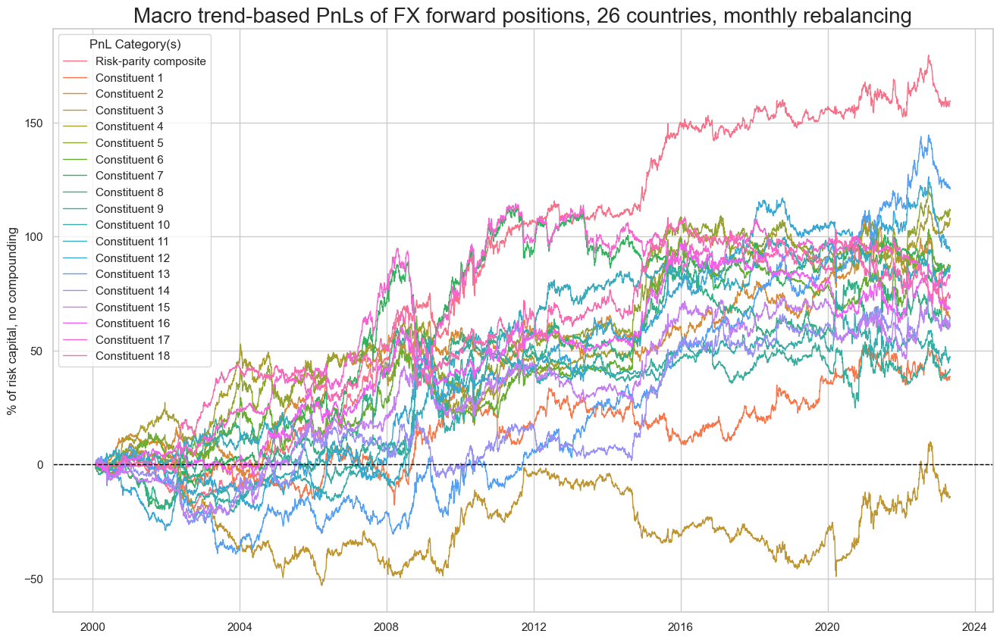

In [71]:
dix = dict_allzs

start = dix["start"]
cidx = dix["cidx"]
sigx = [dix["sig"]] + dix["rivs"]

naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx]


naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Macro trend-based PnLs of FX forward positions, 26 countries, monthly rebalancing",
    xcat_labels=["Risk-parity composite"]
    + ["Constituent " + str(i + 1) for i in range(len(dix["rivs"]))],
    figsize=(16, 10),
)

In [72]:
dix = dict_allzs

start = dix["start"]
sigx = [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,Traded Months
xcat,,,,,,,
CABGDPRATIO_SA_3MMA_D1M1ML3_ZN_PZN,1.658047,10.0,0.165805,0.238394,-12.108537,-17.372839,281
CABGDPRATIO_SA_3MMAv60MMA_ZN_PZN,2.772642,10.0,0.277264,0.391285,-14.878441,-35.210029,281
CABGDPRATIO_SA_6MMA_D1M1ML6_ZN_PZN,-0.605635,10.0,-0.060564,-0.085154,-21.188562,-24.399952,281
CTOT_NSA_P1M12ML1_ZN_PZN,4.625119,10.0,0.462512,0.661454,-12.899172,-24.972673,281
CTOT_NSA_P1M1ML12_ZN_PZN,4.793162,10.0,0.479316,0.684083,-11.171256,-25.368903,281
CTOT_NSA_P1M60ML1_ZN_PZN,3.770742,10.0,0.377074,0.544376,-14.29765,-18.799843,281
INTRGDP_NSA_P1M1ML12_3MMAvBM_ZN_PZN,3.733282,10.0,0.373328,0.512391,-21.304091,-35.79295,281
INTRGDPv5Y_NSA_P1M1ML12_3MMAvBM_ZN_PZN,2.626324,10.0,0.262632,0.379391,-12.107725,-18.713436,281
MBCSCORE_SA_D3M3ML3_ZN_PZN,1.781315,10.0,0.178132,0.251808,-17.604197,-30.07964,281
